## Intro

In [3]:
from PIL import Image, ImageDraw
import numpy as np
import pose as P
from PIL import Image, ImageDraw, ImageEnhance

def draw_poses_on_image(img_path, all_poses_np, skeleton="hand", fading_scale = 25, return_trans=False, radius = 6, line_width = 5,dark_og=False, color='red'):
    pose_init_alpha = 300
    
    if skeleton == "hand":
        skeleton = {"labels": ["WRIST", "THUMB_CMC", "THUMB_MCP", "THUMB_IP", "THUMB_TIP", "INDEX_FINGER_MCP", "INDEX_FINGER_PIP", "INDEX_FINGER_DIP", "INDEX_FINGER_TIP", "MIDDLE_FINGER_MCP", "MIDDLE_FINGER_PIP", "MIDDLE_FINGER_DIP", "MIDDLE_FINGER_TIP", "RING_FINGER_MCP", "RING_FINGER_PIP", "RING_FINGER_DIP", "RING_FINGER_TIP", "PINKY_MCP", "PINKY_PIP", "PINKY_DIP", "PINKY_TIP", "MEAN_ALL"], "edges": [[0,1,2,3,4],[0,5,6,7,8],[9,10,11,12],[13,14,15,16],[0,17,18,19,20],[5,9,13,17]]}    
    elif skeleton == "body":
        skeleton = {"labels": ["nose", "right shoulder", "left shoulder", "right elbow", "left elbow", "right wrist", "left wrist", "right hip", "left hip", "right knee", "left knee", "right ankle", "left ankle"], 'edges': [[5, 3, 1, 2, 4, 6], [11, 9, 7, 8, 10, 12]]}    
    
    # img
    img = Image.open(img_path)
    # img.putalpha(alpha)
    if dark_og:
        enhancer = ImageEnhance.Brightness(img)
        img = enhancer.enhance(0.5)

    # create a transparent layer
    transparent_layer = Image.new("RGBA", img.size, (0, 0, 0, 0))

    # create draw object for the transparent layer
    draw = ImageDraw.Draw(transparent_layer)

    for edge_idx, edge in enumerate(skeleton['edges']):
        for i in range(len(edge)-1):
            x1_y1 = all_poses_np[:, edge[i], :] * [img.width, img.height]
            x2_y2 = all_poses_np[:, edge[i+1], :] * [img.width, img.height]
            for j in range(len(x1_y1)-1, -1, -1):
                current_alpha = pose_init_alpha - j * fading_scale
                if color=='red':
                    draw.line((x1_y1[j][0], x1_y1[j][1], x2_y2[j][0], x2_y2[j][1]), fill=(255, 0, 0, current_alpha), width=line_width)
                elif color=='blue':
                    draw.line((x1_y1[j][0], x1_y1[j][1], x2_y2[j][0], x2_y2[j][1]), fill=(0, 0, 255, current_alpha), width=line_width)
    
    # drawing operations (circles and lines) on the transparent layer
    for rev_pose_idx, pose in enumerate(reversed(all_poses_np)):
        pose_idx = len(all_poses_np) - rev_pose_idx - 1
        current_alpha = pose_init_alpha - pose_idx * fading_scale
        # loop over all keypoints in the pose
        for point_idx, point in enumerate(pose):
            x, y = point * [img.width, img.height]
            if color=='red':
                draw.ellipse((x-radius, y-radius, x+radius, y+radius), fill=(255, 0, 0, current_alpha))
            elif color=='blue':
                draw.ellipse((x-radius, y-radius, x+radius, y+radius), fill=(0, 0, 255, current_alpha))

    # blend the transparent layer with the original image
    img_with_drawn_poses = Image.alpha_composite(img.convert("RGBA"), transparent_layer)
    # img_with_drawn_poses = Image.alpha_composite(img, transparent_layer)

    if not return_trans:
        # convert back to RGB if needed
        return img_with_drawn_poses.convert("RGB")
    else:
        return {"on_img": img_with_drawn_poses, "on_trans": transparent_layer}

def interpolate_poses(start_pose, end_pose, N, noise_intensity = 0.005, scale_variation = 0.002):
    # Create an array to store the interpolated poses
    interpolated_poses = np.zeros((N, start_pose.shape[1], start_pose.shape[2]))

    # Linear interpolation with noise and scaling for each joint
    for i in range(N):
        t = i / (N - 1)
        noise = np.random.randn(*start_pose.shape[1:]) * noise_intensity
        scale = 1 + (np.random.rand() - 0.5) * scale_variation
        interpolated_poses[i] = ((1 - t) * start_pose + t * end_pose + noise) * scale

    # Concatenate start pose, interpolated poses, and end pose
    full_sequence = np.concatenate((start_pose, interpolated_poses, end_pose), axis=0)

    return full_sequence


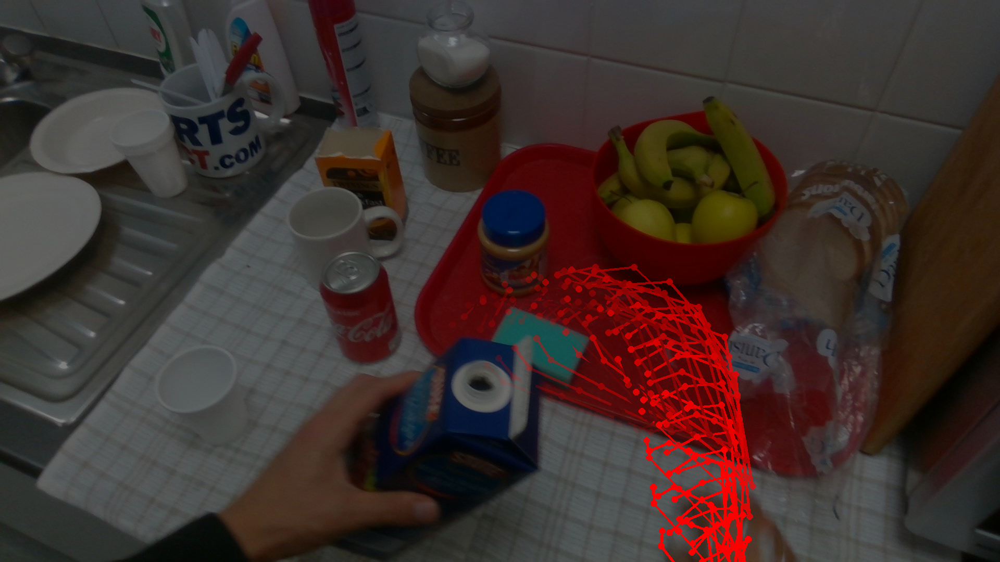

In [175]:
import glob
# test code
img_path = "dat/F-PHAB/F-PHAB_media_v000/Video_files/Subject_1/close_juice_bottle/2/color/0000000001/full_scale.jpg"
keypoints_path = glob.glob(img_path.replace("full_scale.jpg", "forecasting_groundtruth*"))[0]
# keypoints_path = "/z/dat/F-PHAB/F-PHAB_media_v000/Video_files/Subject_1/close_milk/1/color/0000000001/forecasting_groundtruth_close_milk_1_89_v001.json"
# read keypoints
all_poses_list = []
for KP in P.read_Keypoints(keypoints_path).keypoints:
    all_poses_list.append(KP.points)
all_poses_np = np.array(all_poses_list)

drawn_img = draw_poses_on_image(img_path, all_poses_np)
drawn_img.show()

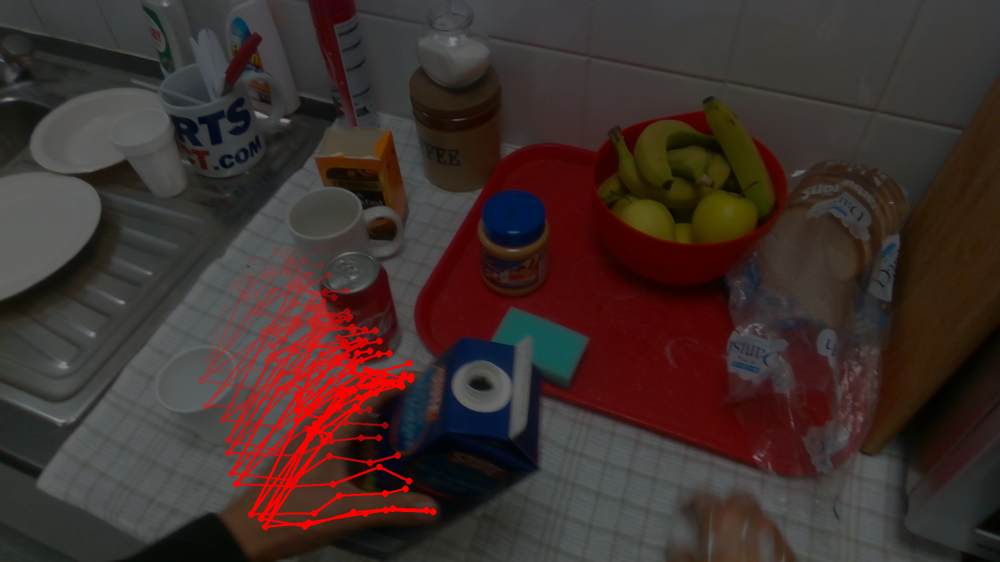

In [23]:
start_pose = P.pose_fo_to_torch(P.mediapipe_detect_pose(np.array(Image.open(img_path)), P.get_pose_detector()), 21).numpy().reshape(1, 21, 2)
end_pose = np.array(((0.08, 0.38), (0.12, 0.37), (0.13, 0.36), (0.17, 0.35), (0.12, 0.33), (0.13, 0.33), (0.15, 0.31), (0.08, 0.35), (0.12, 0.33), (0.11, 0.32), (0.15, 0.30), (0.08, 0.34), (0.09, 0.31), (0.10, 0.30), (0.07, 0.31), (0.11, 0.28), (0.07, 0.31), (0.11, 0.29), (0.14, 0.28), (0.11, 0.33), (0.15, 0.31))).reshape(1, 21, 2) + (+0.001, -0.3)

interpolated_hand_poses = interpolate_poses(start_pose, end_pose, N=30, noise_intensity=0.008, scale_variation=0.002)

draw_poses_on_image(img_path, interpolated_hand_poses)

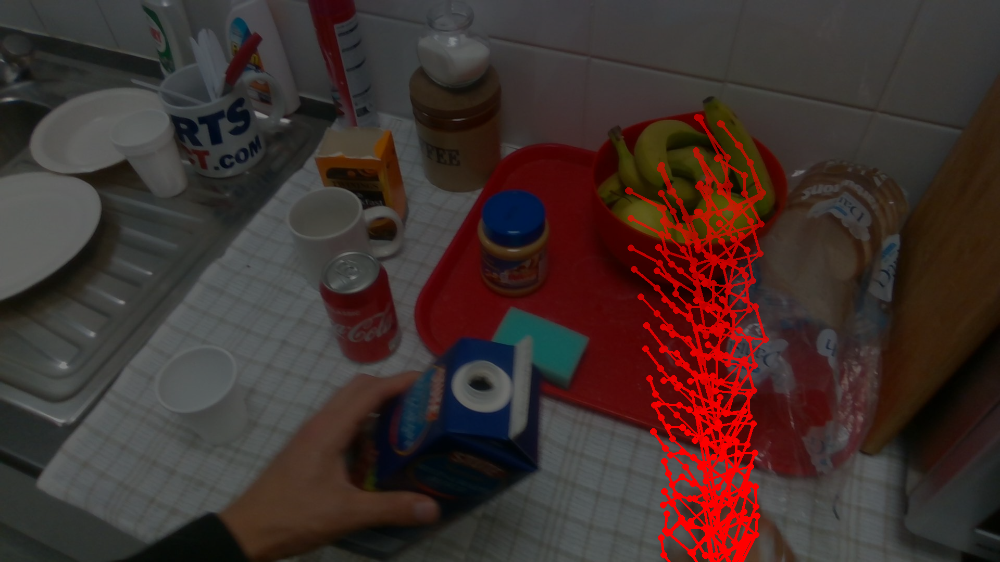

In [199]:
start_pose = all_poses_np[:1]
# end_pose =  np.array(((0.61, 0.40), (0.60, 0.38), (0.59, 0.37), (0.59, 0.36), (0.58, 0.36), (0.62, 0.37), (0.61, 0.34), (0.62, 0.32), (0.63, 0.35), (0.63, 0.33), (0.62, 0.32), (0.61, 0.31), (0.64, 0.33), (0.64, 0.31), (0.63, 0.30), (0.62, 0.27), (0.66, 0.30), (0.67, 0.30), (0.65, 0.26), (0.64, 0.24), (0.69, 0.30))).reshape(1, 21, 2) + (0.1, 0)
# end_pose = P.pose_fo_to_torch(P.mediapipe_detect_pose(np.array(Image.open(img_path)), P.get_pose_detector()), 21).numpy().reshape(1, 21, 2) + (0.4, -0.6)
# end_pose_ =  np.array(((0.60, 0.44), (0.59, 0.42), (0.57, 0.40), (0.56, 0.37), (0.53, 0.34), (0.59, 0.39), (0.58, 0.36), (0.57, 0.34), (0.56, 0.30), (0.61, 0.38), (0.61, 0.34), (0.61, 0.32), (0.60, 0.28), (0.63, 0.37), (0.63, 0.33), (0.62, 0.28), (0.60, 0.21), (0.66, 0.35), (0.65, 0.29), (0.64, 0.26), (0.62, 0.22))).reshape(1, 21, 2) + (0.3, 0.2)
# interpolated_hand_poses_ = interpolate_poses(start_pose, end_pose_, N=15, noise_intensity=0.003, scale_variation=0.01)

end_pose =  np.array(((0.60, 0.44), (0.59, 0.42), (0.57, 0.40), (0.56, 0.37), (0.53, 0.34), (0.59, 0.39), (0.58, 0.36), (0.57, 0.34), (0.56, 0.30), (0.61, 0.38), (0.61, 0.34), (0.61, 0.32), (0.60, 0.28), (0.63, 0.37), (0.63, 0.33), (0.62, 0.28), (0.60, 0.21), (0.66, 0.35), (0.65, 0.29), (0.64, 0.26), (0.62, 0.22))).reshape(1, 21, 2) + (0.1, 0)
interpolated_hand_poses = interpolate_poses(start_pose, end_pose, N=15, noise_intensity=0.003, scale_variation=0.01)


draw_poses_on_image(img_path, interpolated_hand_poses, fading_scale=10)

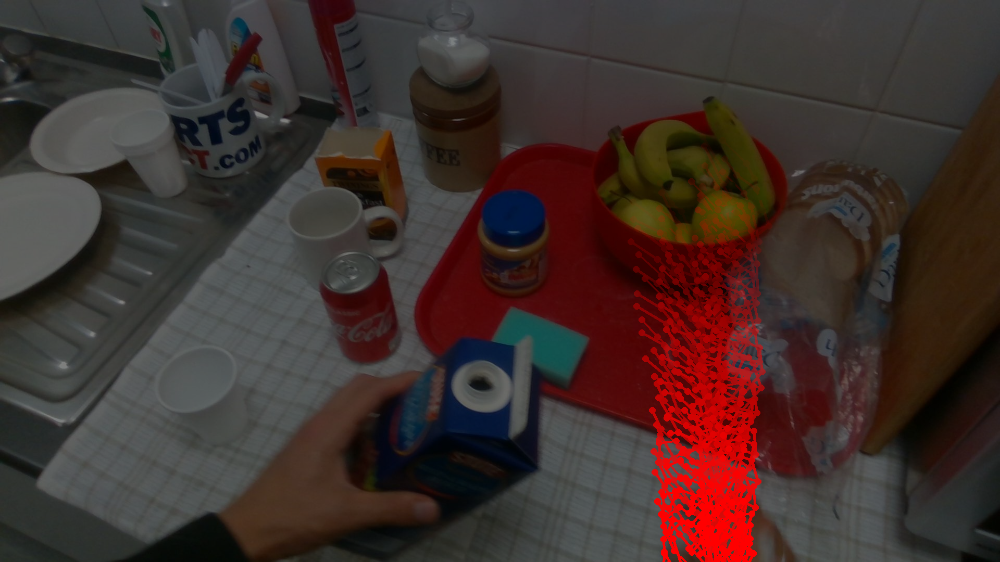

In [71]:
start_pose = all_poses_np[:1]
# end_pose =  np.array(((0.61, 0.40), (0.60, 0.38), (0.59, 0.37), (0.59, 0.36), (0.58, 0.36), (0.62, 0.37), (0.61, 0.34), (0.62, 0.32), (0.63, 0.35), (0.63, 0.33), (0.62, 0.32), (0.61, 0.31), (0.64, 0.33), (0.64, 0.31), (0.63, 0.30), (0.62, 0.27), (0.66, 0.30), (0.67, 0.30), (0.65, 0.26), (0.64, 0.24), (0.69, 0.30))).reshape(1, 21, 2) + (0.1, 0)
# end_pose = P.pose_fo_to_torch(P.mediapipe_detect_pose(np.array(Image.open(img_path)), P.get_pose_detector()), 21).numpy().reshape(1, 21, 2) + (0.4, -0.6)
end_pose_ =  np.array(((0.60, 0.44), (0.59, 0.42), (0.57, 0.40), (0.56, 0.37), (0.53, 0.34), (0.59, 0.39), (0.58, 0.36), (0.57, 0.34), (0.56, 0.30), (0.61, 0.38), (0.61, 0.34), (0.61, 0.32), (0.60, 0.28), (0.63, 0.37), (0.63, 0.33), (0.62, 0.28), (0.60, 0.21), (0.66, 0.35), (0.65, 0.29), (0.64, 0.26), (0.62, 0.22))).reshape(1, 21, 2) + (0.3, 0.2)
interpolated_hand_poses_ = interpolate_poses(start_pose, end_pose_, N=15, noise_intensity=0.003, scale_variation=0.01)

end_pose =  np.array(((0.60, 0.44), (0.59, 0.42), (0.57, 0.40), (0.56, 0.37), (0.53, 0.34), (0.59, 0.39), (0.58, 0.36), (0.57, 0.34), (0.56, 0.30), (0.61, 0.38), (0.61, 0.34), (0.61, 0.32), (0.60, 0.28), (0.63, 0.37), (0.63, 0.33), (0.62, 0.28), (0.60, 0.21), (0.66, 0.35), (0.65, 0.29), (0.64, 0.26), (0.62, 0.22))).reshape(1, 21, 2) + (0.1, 0)
interpolated_hand_poses = interpolate_poses(interpolated_hand_poses_[-1:], end_pose_, N=15, noise_intensity=0.003, scale_variation=0.01)


draw_poses_on_image(img_path, interpolated_hand_poses, fading_scale=10)

In [177]:
import IPython
IPython.display.HTML('./point_tracker.html')

In [4]:
def draw_poses_on_trans(img_path, all_poses_np, skeleton="hand", fading_scale = 25, return_trans=True, radius = 6, line_width = 5):
    pose_init_alpha = 300
    
    if skeleton == "hand":
        skeleton = {"labels": ["WRIST", "THUMB_CMC", "THUMB_MCP", "THUMB_IP", "THUMB_TIP", "INDEX_FINGER_MCP", "INDEX_FINGER_PIP", "INDEX_FINGER_DIP", "INDEX_FINGER_TIP", "MIDDLE_FINGER_MCP", "MIDDLE_FINGER_PIP", "MIDDLE_FINGER_DIP", "MIDDLE_FINGER_TIP", "RING_FINGER_MCP", "RING_FINGER_PIP", "RING_FINGER_DIP", "RING_FINGER_TIP", "PINKY_MCP", "PINKY_PIP", "PINKY_DIP", "PINKY_TIP", "MEAN_ALL"], "edges": [[0,1,2,3,4],[0,5,6,7,8],[9,10,11,12],[13,14,15,16],[0,17,18,19,20],[5,9,13,17]]}    
    elif skeleton == "body":
        skeleton = {'labels': ["nose", "right shoulder", "left shoulder", "right elbow", "left elbow", "right wrist", "left wrist", "right hip", "left hip", "right knee", "left knee", "right ankle", "left ankle"], 'edges': [[5, 3, 1, 2, 4, 6], [11, 9, 7, 8, 10, 12]]}    
    
    # img
    img = Image.open(img_path)
    # img.putalpha(alpha)
    enhancer = ImageEnhance.Brightness(img)
    img = enhancer.enhance(0.5)

    # create a transparent layer
    transparent_layer_list = []
    draw_list = []
    for t_i in range(len(all_poses_np)):
        transparent_layer = Image.new("RGBA", img.size, (0, 0, 0, 0))
        transparent_layer_list.append(transparent_layer)

        # create draw object for the transparent layer
        draw = ImageDraw.Draw(transparent_layer)
        draw_list.append(draw)

    for edge_idx, edge in enumerate(skeleton['edges']):
        for i in range(len(edge)-1):
            x1_y1 = all_poses_np[:, edge[i], :] * [img.width, img.height]
            x2_y2 = all_poses_np[:, edge[i+1], :] * [img.width, img.height]
            for j in range(len(x1_y1)-1, -1, -1):
                current_alpha = pose_init_alpha - j * fading_scale
                draw_list[j].line((x1_y1[j][0], x1_y1[j][1], x2_y2[j][0], x2_y2[j][1]), fill=(255, 0, 0, current_alpha), width=line_width)
    
    # drawing operations (circles and lines) on the transparent layer
    for rev_pose_idx, pose in enumerate(reversed(all_poses_np)):
        pose_idx = len(all_poses_np) - rev_pose_idx - 1
        current_alpha = pose_init_alpha - pose_idx * fading_scale
        # loop over all keypoints in the pose
        for point_idx, point in enumerate(pose):
            x, y = point * [img.width, img.height]
            draw_list[pose_idx].ellipse((x-radius, y-radius, x+radius, y+radius), fill=(255, 0, 0, current_alpha))


    # blend the transparent layer with the original image
    img_with_drawn_poses = Image.alpha_composite(img.convert("RGBA"), transparent_layer_list[0])
    return {"on_img": img_with_drawn_poses, "on_trans": transparent_layer_list}
    
import time
# test code
img_path = f"./dat/PennAction/Penn_Action_media_v000/frames/0738/0000000001/full_scale.jpg"
keypoints_path = glob.glob(img_path.replace("full_scale.jpg", "forecasting_groundtruth*"))[0]
# keypoints_path = "/z/dat/F-PHAB/F-PHAB_media_v000/Video_files/Subject_1/close_milk/1/color/0000000001/forecasting_groundtruth_close_milk_1_89_v001.json"
# read keypoints
all_poses_list = []
for KP in P.read_Keypoints(keypoints_path).keypoints:
    all_poses_list.append(KP.points)
all_poses_np = np.array(all_poses_list)

drawn_img_return = draw_poses_on_trans(img_path, all_poses_np, skeleton="body", return_trans=True, fading_scale = 0, radius = 3, line_width = 3)
drawn_img_return["on_img"].show()

# drawn_img_return["on_img"].save("../tmp/intro/0738_og.png")
# for i in range(len(drawn_img_return["on_trans"])):
#     trans = drawn_img_return["on_trans"][i]
#     trans.save(f"../tmp/intro/0738_pose_{i}.png")


SyntaxError: unterminated string literal (detected at line 7) (1711267336.py, line 7)

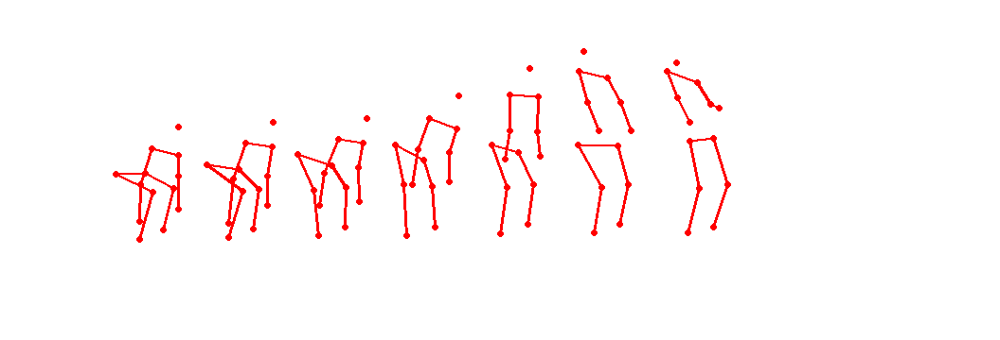

In [140]:
from PIL import Image

def create_composite_image(images, overlap_rate):

    # Calculate the width and height of the composite image
    total_width = sum(image.width for image in images) - int(overlap_rate * (len(images) - 1) * images[0].width)
    max_height = max(image.height for image in images)

    # Create a new blank image with the calculated dimensions
    composite_image = Image.new('RGBA', (total_width, max_height), (0,0,0,0))

    # Paste each image onto the composite image
    x_offset = 0
    for i, image in enumerate(images):
        composite_image.paste(image, (x_offset, 0), image)
        x_offset += image.width - int(overlap_rate * image.width)

    return composite_image

# List of image paths
image_paths = [f"../tmp/intro/0738_pose_{i}.png" for i in range(31)] 
images = [Image.open(image_path) for image_path in image_paths]
images = drawn_img_return["on_trans"][0::5] # Start from index 0, go to the end, step by 5
# Overlap rate (0.0 to 1.0, where 0.2 means 20% overlap)
overlap_rate = 0.8 # change overlap rate w.r.t. the original image size

# Create and save the composite image
composite = create_composite_image(images, overlap_rate)
composite.show()
composite.save('../tmp/composite_image.png')


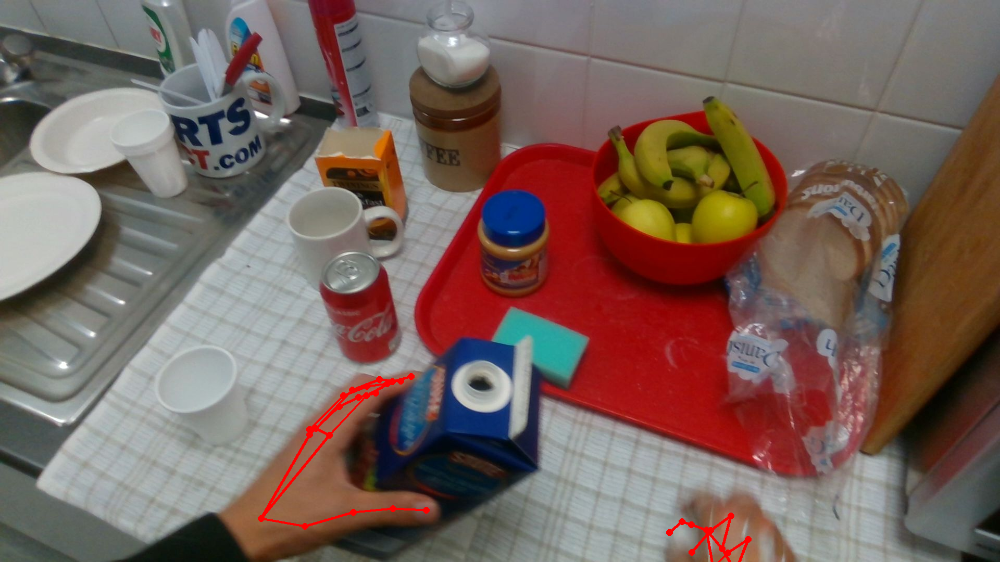

In [218]:
import time
# test code
img_path = f"dat/F-PHAB/F-PHAB_media_v000/Video_files/Subject_1/close_juice_bottle/2/color/0000000001/full_scale.jpg"
keypoints_path = glob.glob(img_path.replace("full_scale.jpg", "forecasting_groundtruth*"))[0]
# keypoints_path = "/z/dat/F-PHAB/F-PHAB_media_v000/Video_files/Subject_1/close_milk/1/color/0000000001/forecasting_groundtruth_close_milk_1_89_v001.json"
# read keypoints
all_poses_list = []
for KP in P.read_Keypoints(keypoints_path).keypoints:
    all_poses_list.append(KP.points)
all_poses_np = np.array(all_poses_list)

all_poses_np = np.concatenate((P.pose_fo_to_torch(P.mediapipe_detect_pose(np.array(Image.open(img_path)), P.get_pose_detector()), 21).numpy().reshape(1, 21, 2), all_poses_np[:1]), axis=0)

drawn_img_return = draw_poses_on_image(img_path, all_poses_np, skeleton="hand", return_trans=False, dark_og=False)
drawn_img_return.show()
drawn_img_return.save("../tmp/hand_og.png")

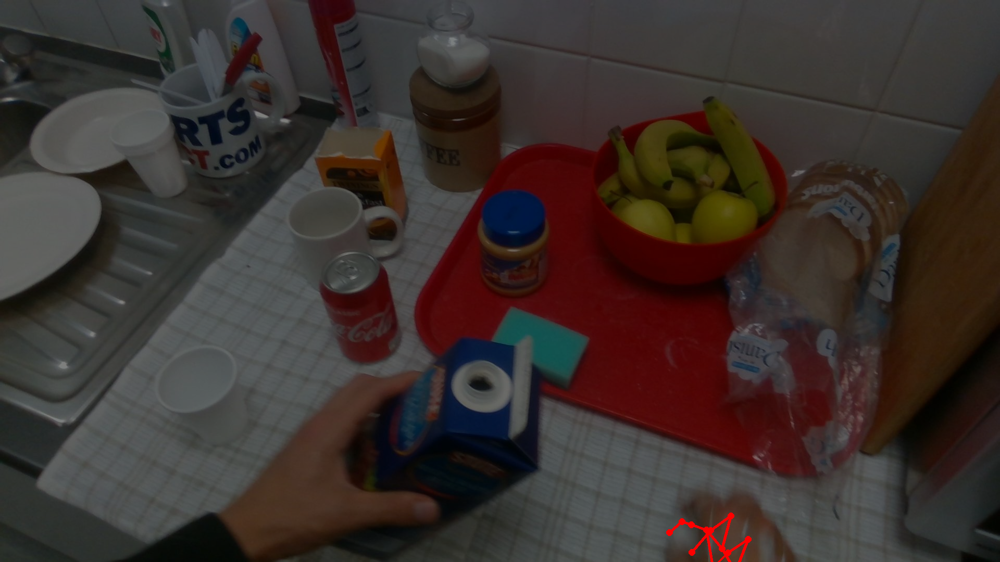

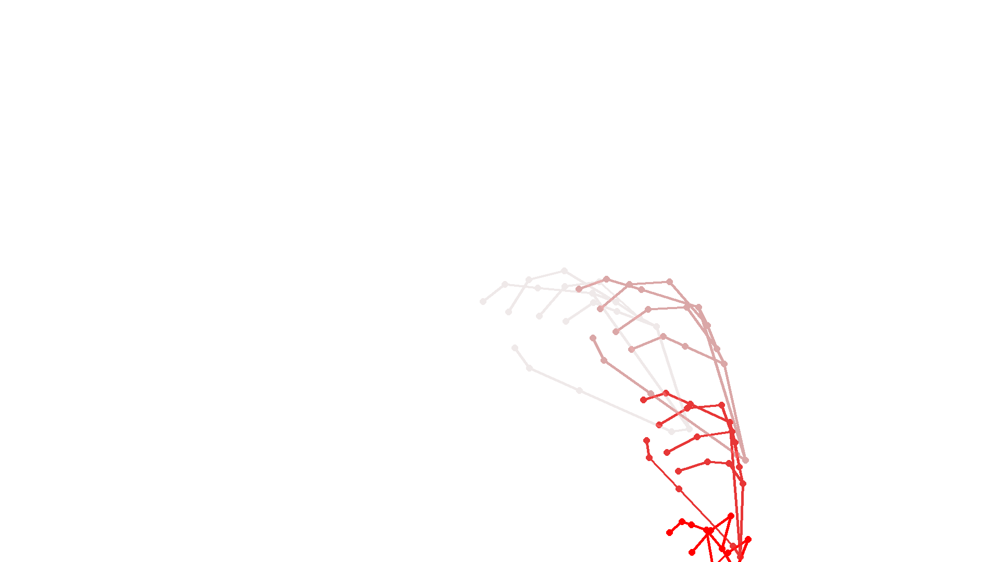

In [215]:
import time
# test code
img_path = f"dat/F-PHAB/F-PHAB_media_v000/Video_files/Subject_1/close_juice_bottle/2/color/0000000001/full_scale.jpg"
keypoints_path = glob.glob(img_path.replace("full_scale.jpg", "forecasting_groundtruth*"))[0]
# keypoints_path = "/z/dat/F-PHAB/F-PHAB_media_v000/Video_files/Subject_1/close_milk/1/color/0000000001/forecasting_groundtruth_close_milk_1_89_v001.json"
# read keypoints
all_poses_list = []
for KP in P.read_Keypoints(keypoints_path).keypoints:
    all_poses_list.append(KP.points)
all_poses_np = np.array(all_poses_list)

drawn_img_return = draw_poses_on_trans(img_path, all_poses_np, skeleton="hand", return_trans=True)
drawn_img_return["on_img"].show()


images = drawn_img_return["on_trans"][0::3] # Start from index 0, go to the end, step by 5
# Overlap rate (0.0 to 1.0, where 0.2 means 20% overlap)
overlap_rate = 1 # change overlap rate w.r.t. the original image size

# Create and save the composite image
composite = create_composite_image(images, overlap_rate)
composite.show()
composite.save('../tmp/hand_1.png')


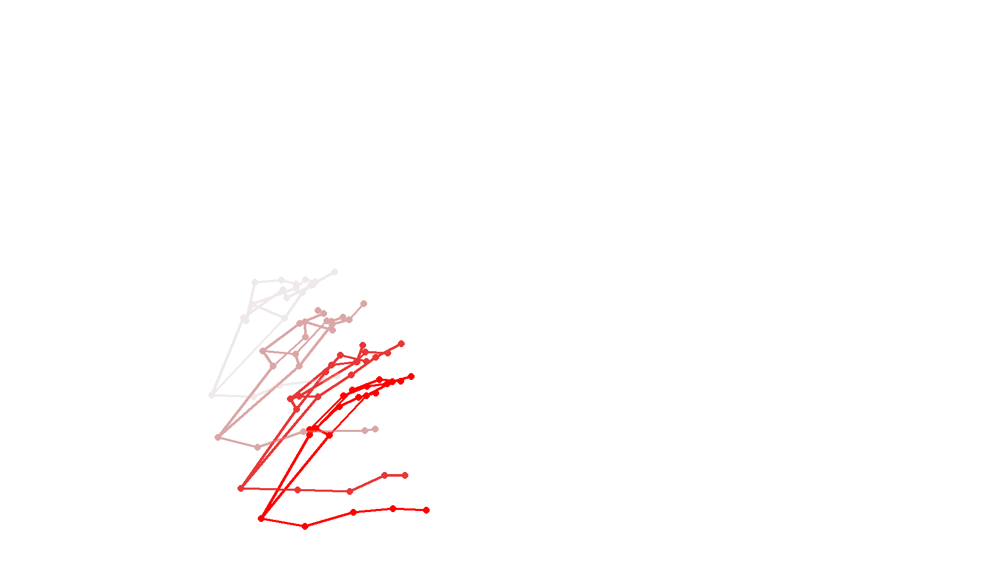

In [173]:
start_pose = P.pose_fo_to_torch(P.mediapipe_detect_pose(np.array(Image.open(img_path)), P.get_pose_detector()), 21).numpy().reshape(1, 21, 2)
end_pose = np.array(((0.08, 0.38), (0.12, 0.37), (0.13, 0.36), (0.17, 0.35), (0.12, 0.33), (0.13, 0.33), (0.15, 0.31), (0.08, 0.35), (0.12, 0.33), (0.11, 0.32), (0.15, 0.30), (0.08, 0.34), (0.09, 0.31), (0.10, 0.30), (0.07, 0.31), (0.11, 0.28), (0.07, 0.31), (0.11, 0.29), (0.14, 0.28), (0.11, 0.33), (0.15, 0.31))).reshape(1, 21, 2) + (+0.001, -0.3)

interpolated_hand_poses = interpolate_poses(start_pose, end_pose, N=30, noise_intensity=0.008, scale_variation=0.002)

drawn_img_return = draw_poses_on_trans(img_path, interpolated_hand_poses)

images = drawn_img_return["on_trans"][0::3] # Start from index 0, go to the end, step by 5
# Overlap rate (0.0 to 1.0, where 0.2 means 20% overlap)
overlap_rate = 1 # change overlap rate w.r.t. the original image size

# Create and save the composite image
composite = create_composite_image(images, overlap_rate)
composite.show()
composite.save('../tmp/hand_2.png')

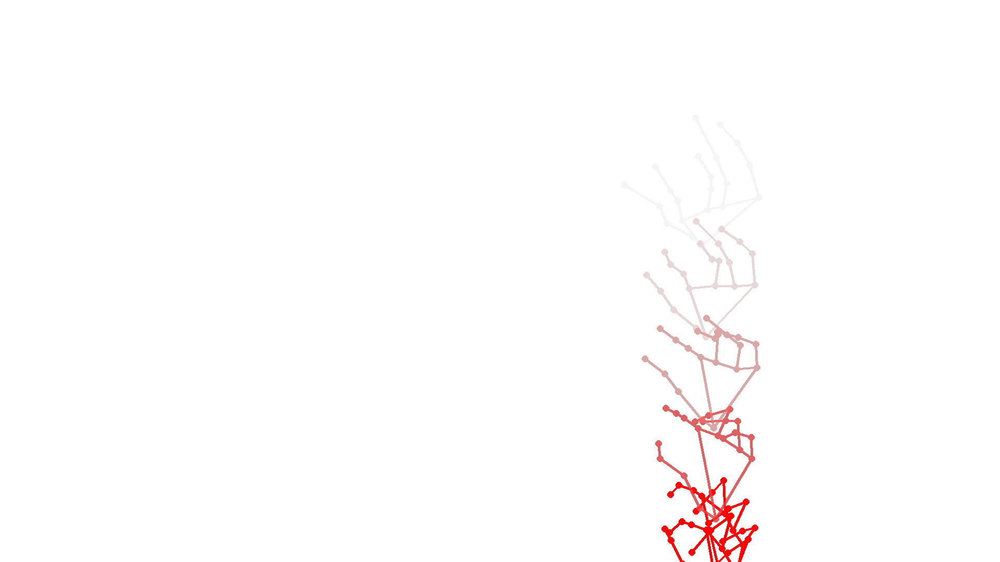

In [203]:
start_pose = all_poses_np[:1]
# end_pose =  np.array(((0.61, 0.40), (0.60, 0.38), (0.59, 0.37), (0.59, 0.36), (0.58, 0.36), (0.62, 0.37), (0.61, 0.34), (0.62, 0.32), (0.63, 0.35), (0.63, 0.33), (0.62, 0.32), (0.61, 0.31), (0.64, 0.33), (0.64, 0.31), (0.63, 0.30), (0.62, 0.27), (0.66, 0.30), (0.67, 0.30), (0.65, 0.26), (0.64, 0.24), (0.69, 0.30))).reshape(1, 21, 2) + (0.1, 0)
# end_pose = P.pose_fo_to_torch(P.mediapipe_detect_pose(np.array(Image.open(img_path)), P.get_pose_detector()), 21).numpy().reshape(1, 21, 2) + (0.4, -0.6)
# end_pose_ =  np.array(((0.60, 0.44), (0.59, 0.42), (0.57, 0.40), (0.56, 0.37), (0.53, 0.34), (0.59, 0.39), (0.58, 0.36), (0.57, 0.34), (0.56, 0.30), (0.61, 0.38), (0.61, 0.34), (0.61, 0.32), (0.60, 0.28), (0.63, 0.37), (0.63, 0.33), (0.62, 0.28), (0.60, 0.21), (0.66, 0.35), (0.65, 0.29), (0.64, 0.26), (0.62, 0.22))).reshape(1, 21, 2) + (0.3, 0.2)
# interpolated_hand_poses_ = interpolate_poses(start_pose, end_pose_, N=15, noise_intensity=0.003, scale_variation=0.01)

end_pose =  np.array(((0.60, 0.44), (0.59, 0.42), (0.57, 0.40), (0.56, 0.37), (0.53, 0.34), (0.59, 0.39), (0.58, 0.36), (0.57, 0.34), (0.56, 0.30), (0.61, 0.38), (0.61, 0.34), (0.61, 0.32), (0.60, 0.28), (0.63, 0.37), (0.63, 0.33), (0.62, 0.28), (0.60, 0.21), (0.66, 0.35), (0.65, 0.29), (0.64, 0.26), (0.62, 0.22))).reshape(1, 21, 2) + (0.1, 0)
interpolated_hand_poses = interpolate_poses(start_pose, end_pose, N=10, noise_intensity=0.003, scale_variation=0.01)


drawn_img_return = draw_poses_on_trans(img_path, interpolated_hand_poses, fading_scale=25)

images = drawn_img_return["on_trans"][0::2] # Start from index 0, go to the end, step by 5
# Overlap rate (0.0 to 1.0, where 0.2 means 20% overlap)
overlap_rate = 1 # change overlap rate w.r.t. the original image size

# Create and save the composite image
composite = create_composite_image(images, overlap_rate)
composite.show()
composite.save('../tmp/hand_3.png')

## eval

In [2]:
import torch
import os

exp_folder = "/z/exp/lgpf/workspace/ptg_research/exp15/outputs/experiments/exp_0010_202308092211"
predictions = torch.load(os.path.join(exp_folder, "outputs/best_predictions_val.pt"))
labels = torch.load(os.path.join(exp_folder, "outputs/labels_val.pt"))
print(labels.keys())

dict_keys(['/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000001/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000002/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000003/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000004/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000005/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000006/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000007/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000008/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000009/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000010/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000011/full_scale.jpg', '/z/dat/PennAction/Penn_Action_media_v000/frames/0010/0000000012/full_scale.jpg', '/z/d

In [5]:
import glob
keypoints_path = glob.glob(img_path.replace("full_scale.jpg", "forecasting_groundtruth*"))[0]
# keypoints_path = "/z/dat/F-PHAB/F-PHAB_media_v000/Video_files/Subject_1/close_milk/1/color/0000000001/forecasting_groundtruth_close_milk_1_89_v001.json"
# read keypoints
all_poses_list = []
for KP in P.read_Keypoints(keypoints_path).keypoints:
    all_poses_list.append(KP.points)
all_poses_np = np.array(all_poses_list)
all_poses_np.shape

NameError: name 'img_path' is not defined

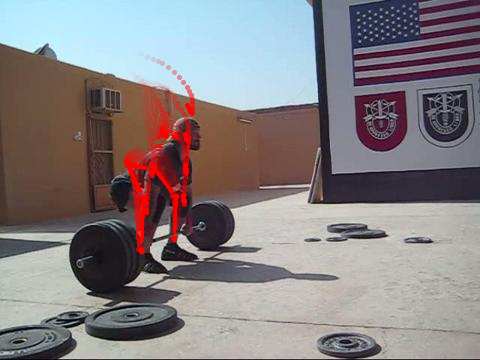

In [19]:
img_path = "/z/dat/PennAction/Penn_Action_media_v000/frames/0738/0000000001/full_scale.jpg"
all_poses_np = predictions[img_path].numpy().reshape(30, -1, 2)
drawn_img = draw_poses_on_image(img_path, all_poses_np, skeleton="body", fading_scale = 12, radius = 2, line_width = 2)
drawn_img.show()



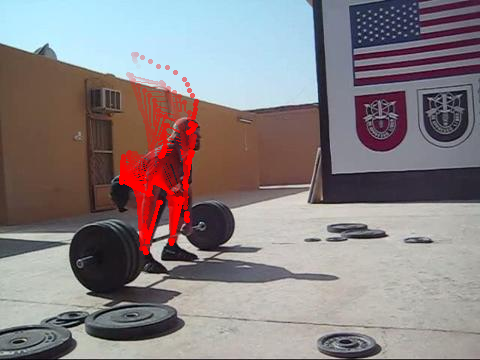

In [255]:
img_path = "/z/dat/PennAction/Penn_Action_media_v000/frames/0738/0000000001/full_scale.jpg"
all_poses_np = labels[img_path].numpy().reshape(30, -1, 2)
drawn_img = draw_poses_on_image(img_path, all_poses_np, skeleton="body", fading_scale = 10, radius = 2, line_width = 2)
drawn_img.show()


In [ ]:
img_path = "/z/dat/PennAction/Penn_Action_media_v000/frames/0638/0000000011/full_scale.jpg"
img = Image.open(img_path)
img.show()
img.putalpha(128)


label_pose = draw_poses_on_image(img_path, labels[img_path].numpy().reshape(30, -1, 2)[:10], skeleton="body", fading_scale = 10, radius = 2, line_width = 2, return_trans=True, color='red')["on_trans"]
vis = Image.alpha_composite(img, label_pose)
vis.show()
pred_pose = draw_poses_on_image(img_path, predictions[img_path].numpy().reshape(30, -1, 2)[:10], skeleton="body", fading_scale = 10, radius = 2, line_width = 2, return_trans=True, color='blue')["on_trans"]
# vis.save("../tmp/results/1_output.png")

label_pose = draw_poses_on_image(img_path, labels[img_path].numpy().reshape(30, -1, 2)[:20], skeleton="body", fading_scale = 10, radius = 2, line_width = 2, return_trans=True, color='red')["on_trans"]
pred_pose = draw_poses_on_image(img_path, predictions[img_path].numpy().reshape(30, -1, 2)[:20], skeleton="body", fading_scale = 10, radius = 2, line_width = 2, return_trans=True, color='blue')["on_trans"]
vis = Image.alpha_composite(img, Image.alpha_composite(pred_pose, label_pose))
vis.show()

label_pose = draw_poses_on_image(img_path, labels[img_path].numpy().reshape(30, -1, 2)[:30], skeleton="body", fading_scale = 10, radius = 2, line_width = 2, return_trans=True, color='red')["on_trans"]
pred_pose = draw_poses_on_image(img_path, predictions[img_path].numpy().reshape(30, -1, 2)[:30], skeleton="body", fading_scale = 10, radius = 2, line_width = 2, return_trans=True, color='blue')["on_trans"]
vis = Image.alpha_composite(img, Image.alpha_composite(pred_pose, label_pose))
vis.show()

In [21]:
import pandas as pd
ann_pd = pd.read_csv(f"/z/dat/PennAction/Penn_Action_media_v000/vid_ann.csv")
ann_pd

,Unnamed: 0,total_frame_count,raw_narration,pose,video_dimensions,frames
0,1,151,baseball_pitch,back,"[360, 480, 151]",{}
1,2,80,baseball_pitch,back,"[270, 480, 80]",{}
2,3,85,baseball_pitch,right,"[270, 480, 85]",{}
3,4,82,baseball_pitch,front,"[270, 480, 82]",{}
4,5,48,baseball_pitch,front,"[270, 480, 48]",{}
...,...,...,...,...,...,...
2321,2322,80,tennis_serve,back,"[270, 480, 80]",{}
2322,2323,50,tennis_serve,front,"[270, 480, 50]",{}
2323,2324,71,tennis_serve,left,"[270, 480, 71]",{}
2324,2325,56,tennis_serve,right,"[270, 480, 56]",{}


In [ ]:
import time
import random
key_list = list(predictions.keys())
random.shuffle(key_list)
prev_img_path = None
for img_path in key_list:
    if prev_img_path == img_path.split("/")[:-2]:
        continue
    prev_img_path = img_path.split("/")[:-2]
    print(f"{img_path} {ann_pd.loc[int(img_path.split('/')[-3])-1]['raw_narration']}")
    
    # img_path = "/z/dat/PennAction/Penn_Action_media_v000/frames/0638/0000000011/full_scale.jpg"
    img = Image.open(img_path)
    img.show()
    img.putalpha(128)


    label_pose = draw_poses_on_image(img_path, labels[img_path].numpy().reshape(30, -1, 2), skeleton="body", fading_scale = 13, radius = 2, line_width = 2, return_trans=True, color='red')["on_trans"]
    pred_pose = draw_poses_on_image(img_path, predictions[img_path].numpy().reshape(30, -1, 2), skeleton="body", fading_scale = 13, radius = 2, line_width = 2, return_trans=True, color='blue')["on_trans"]
    vis = Image.alpha_composite(img, Image.alpha_composite(pred_pose, label_pose))
    vis.show()
    # vis.save("../tmp/results/1_output.png")
    time.sleep(1)

### f-phab

In [3]:
import torch
import os

exp_folder = "/z/exp/lgpf/workspace/ptg_research/exp15/outputs/experiments/exp_0099_202308310404"
predictions = torch.load(os.path.join(exp_folder, "outputs/best_predictions_val.pt"))
labels = torch.load(os.path.join(exp_folder, "outputs/labels_val.pt"))
print(labels.keys())


dict_keys([('/z/dat/F-PHAB/F-PHAB_media_v000/Video_files/Subject_1/flip_pages/2/color/0000000001/full_scale.jpg', 'flip_pages', tensor([0.6213, 0.9536, 0.6320, 0.9246, 0.5693, 0.7838, 0.5358, 0.7086, 0.5164,
        0.6396, 0.6239, 0.7026, 0.5568, 0.6572, 0.5135, 0.6279, 0.4826, 0.6227,
        0.6080, 0.7481, 0.5392, 0.6904, 0.4938, 0.6722, 0.4579, 0.6610, 0.5966,
        0.7978, 0.5373, 0.7692, 0.4931, 0.7594, 0.4533, 0.7503, 0.5863, 0.8341,
        0.5527, 0.7978, 0.5336, 0.7772, 0.5041, 0.7529])), ('/z/dat/F-PHAB/F-PHAB_media_v000/Video_files/Subject_1/flip_pages/2/color/0000000002/full_scale.jpg', 'flip_pages', tensor([0.6210, 0.9542, 0.6318, 0.9250, 0.5693, 0.7843, 0.5359, 0.7091, 0.5165,
        0.6399, 0.6235, 0.7033, 0.5566, 0.6578, 0.5133, 0.6283, 0.4824, 0.6232,
        0.6076, 0.7489, 0.5393, 0.6904, 0.4936, 0.6732, 0.4577, 0.6618, 0.5961,
        0.7986, 0.5365, 0.7720, 0.4923, 0.7619, 0.4525, 0.7525, 0.5859, 0.8350,
        0.5527, 0.7979, 0.5340, 0.7769, 0.5045, 0.7524])

In [7]:
predictions_list = list(predictions.items())
labels_list = list(labels.items())

In [ ]:
import time
import random
index_list = list(range(len(predictions)))
random.shuffle(index_list)
prev_img_path = None
for kv_index in index_list:
    key, prediction = predictions_list[kv_index]
    key, label = labels_list[kv_index]
    
    img_path = key[0]
    if prev_img_path == img_path.split("/")[:-2]:
        continue
    prev_img_path = img_path.split("/")[:-2]
    print(f"{img_path} {key[1]}")
    
    # img_path = "/z/dat/PennAction/Penn_Action_media_v000/frames/0638/0000000011/full_scale.jpg"
    img = Image.open(img_path)
    img.show()
    img.putalpha(128)

    label_pose = draw_poses_on_image(img_path, label.numpy().reshape(30, -1, 2), skeleton="hand", fading_scale = 16, radius = 5, line_width = 5, return_trans=True, color='red')["on_trans"]
    pred_pose = draw_poses_on_image(img_path, prediction.numpy().reshape(30, -1, 2), skeleton="hand", fading_scale = 16, radius = 5, line_width = 5, return_trans=True, color='blue')["on_trans"]
    vis = Image.alpha_composite(img, Image.alpha_composite(pred_pose, label_pose))
    vis.show()
    # vis.save("../tmp/results/1_output.png")
    time.sleep(1)